In [1]:
import spacy

import nltk
from nltk.corpus import stopwords

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import re
import pickle
import ast

from sklearn import metrics
from mgp import MovieGroupProcess

# NLP-Pipeline 

### In this notebook the GSDMM implementation by Rayan Walker was used, without it the section "Training" cannot be compiled.

- https://github.com/rwalk/gsdmm

In [3]:
"""pd.reset_option('display.max_rows')
pd.reset_option('display.max_colwidth')"""

"pd.reset_option('display.max_rows')\npd.reset_option('display.max_colwidth')"

## Paths

In [4]:
dir_raw_data = r"C:\Users\jasha\PycharmProjects\tryScraping\FW_DatenV2.csv"
dir_training_data = r"C:\Users\jasha\BA-Recherche\STTM-Project\Traings-Datensatz.csv"
dir_evaluation_data = r"C:\Users\jasha\BA-Recherche\STTM-Project\Evaluations-Datensatz.csv"

## Inspection of Raw Data 

In [5]:
df = pd.read_csv(dir_raw_data)

In [6]:
df.head(10)

,Date Created,Number of Likes,Source of Tweet,Tweets
0,2023-03-02 23:36:37+00:00,161,Twitter for iPad,Update:\nDer Brand ist gelöscht. 200 m² waren ...
1,2023-03-02 19:24:48+00:00,225,Twitter for iPhone,#Brand in #Prenzlauer_Berg Es brennt das Dach ...
2,2023-03-01 15:10:17+00:00,224,Twitter for Android,#Verkehrsunfall zwischen einem Schulbus und 2 ...
3,2023-02-28 06:25:48+00:00,131,Twitter for iPhone,In der vergangenen Nacht kam es in der #Charlo...
4,2023-02-28 06:25:33+00:00,166,Twitter for iPhone,Gestern Nachmittag entdeckten Passanten im #We...
5,2023-02-27 16:22:32+00:00,195,Twitter for iPhone,#Brand im Keller eines #Hochhaus​es in der #Bi...
6,2023-02-26 17:19:14+00:00,166,Twitter for iPhone,In der Straße #Rue_Racine in #Wittenau kam es ...
7,2023-02-26 10:48:20+00:00,192,Twitter for iPhone,In der #Danziger_Straße in #Prenzlauer_Berg ka...
8,2023-02-26 10:30:10+00:00,139,Twitter for iPhone,Ein Technischer Defekt im Klimagerät eines Reg...
9,2023-02-26 09:54:02+00:00,192,Twitter for Android,Verpuffung im Bereich eines Triebwagen an eine...


## Loading & Analysing Training-Data

In [7]:
tweets_df = pd.read_csv(dir_training_data)

In [8]:
len(tweets_df)

9450

In [9]:
tweets_df.head(10)

,Tweets
0,Update: Der Brand ist gelöscht. 200 m² waren b...
1,Gestern Nachmittag entdeckten Passanten im #We...
2,Ein Technischer Defekt im Klimagerät eines Reg...
3,Verpuffung im Bereich eines Triebwagen an eine...
4,Update #Wedding Wir werden noch längere Zeit m...
5,#Brand in #Wittenau. Seit 19:00 Uhr brennt es ...
6,Update: Es brannte eine Wohnung im 1.OG. 10 Pe...
7,#Brand in #Spandau im 3.OG eines 4-geschossige...
8,#Tierrettung in #Spandau Ein Schwan ist gegen ...
9,Bei der #GefahrenlagePolizei handelt es sich u...


### Inspection of Hashtags per Tweet

In [11]:
def getHashtags(tweets_df, column):
    hashlist = []
    
    for tweet in tweets_df[column]:
        hashtags = []
        wordlist = tweet.split()
        for word in wordlist:
            if(word[0] == '#'):
                hashtags.append(word)
                
        hashlist.append(hashtags)
    return hashlist
    

In [12]:
hashtags_list = getHashtags(tweets_df, 'Tweets')


In [13]:
combined_df = pd.DataFrame(columns=['Tweet', 'Hashtags'])
combined_df['Tweet'] = tweets_df['Tweets']
combined_df['Hashtags'] = hashtags_list

In [14]:
combined_df.head(20)

,Tweet,Hashtags
0,Update: Der Brand ist gelöscht. 200 m² waren b...,"[#DLK, #eLHF, #LFW., #Nordost]"
1,Gestern Nachmittag entdeckten Passanten im #We...,[#Weißensee]
2,Ein Technischer Defekt im Klimagerät eines Reg...,[#EstuK]
3,Verpuffung im Bereich eines Triebwagen an eine...,"[#Hauptbahnhof, #Moabit.]"
4,Update #Wedding Wir werden noch längere Zeit m...,"[#Wedding, #Nachbarschaftshilfe]"
5,#Brand in #Wittenau. Seit 19:00 Uhr brennt es ...,"[#Brand, #Wittenau., #Schlitzer_Straße]"
6,Update: Es brannte eine Wohnung im 1.OG. 10 Pe...,[]
7,#Brand in #Spandau im 3.OG eines 4-geschossige...,"[#Brand, #Spandau]"
8,#Tierrettung in #Spandau Ein Schwan ist gegen ...,"[#Tierrettung, #Spandau]"
9,Bei der #GefahrenlagePolizei handelt es sich u...,"[#GefahrenlagePolizei, #EstuK]"


### Number of Tweets without any Hashtags:

In [15]:
emptylist = combined_df['Hashtags'].apply(lambda x: x == [])
count = 0
for bool in emptylist:
    if(bool):
        count = count +1

In [16]:
count

1785

## Tokenization & Preprocessing

In [17]:
#to remove strings with numbers
def isStringNotContainingNumber(input_string):
    flag = True
    for ch in input_string:
        ascii_code = ord(ch)
        if 47 < ascii_code < 58:
            flag = False
    return flag

In [18]:
def getStopwords():
    stop_words = set(stopwords.words('german'))
    noisy_words = ['estuk',
                   '@berliner_fw',
                   'berliner',
                   'berlin',
                   'bitte',
                   'ort',
                   'uhr',
                   'heute',
                   'update',
                   'kraft',
                   'einsatz',
                   'weit',  #->
                   'infos', #-> "weitere infos folgen" occurs very often, but has no significance
                   'folgen' #->
                  ]
    stop_words.update(noisy_words)
        
    return stop_words

In [19]:
def getDokumentTokens(doc):
    stop_words = getStopwords()
    
    dokumentToken = []

    #get array of lemmatized, lower case tokens, puctuations and tokens with length 1 are removed + removal of stopwords
    for token in doc:
        word = token.lemma_.lower()
        if(word != '--'):
            if(word[0] != ' '):
                if(len(word) > 1):
                    if(isStringNotContainingNumber(word)):
                        if word not in stop_words:
                            dokumentToken.append(word)
            
                
    
    return dokumentToken

In [20]:
docList = tweets_df['Tweets'].apply(lambda x: getDokumentTokens(nlp(x)))

In [21]:
docList[0]

['updat',
 'brand',
 'löschen',
 'm²',
 'betreffen',
 'ausbreitung',
 'verhindern',
 'person',
 'kommen',
 'klinik',
 'katze',
 'retten',
 'dlk',
 'elhf',
 'lhf',
 'lfw',
 '@ba_pankow',
 '@drk_berlin',
 'nordost',
 'sorgen',
 'betreuung',
 'unterbringung',
 'bewohner']

In [22]:
def grid_builder(display_value_list):
    row_len = 0
    
    for x in display_value_list:
        row = x[0]+str(x[1]) 
        if(len(row)>row_len):
            row_len = len(row)
    
    print("+"+"-"*(row_len+4)+"+")
    for x in display_value_list:
        rest_of_row = row_len-len(x[0]+str(x[1]))
        print('| '+ x[0], x[1],' '*rest_of_row+' |')
        print("+"+"-"*(row_len+4)+"+")

In [23]:
tokenLengthList = docList.apply(lambda x: len(x))

corpus = set(x for doc in docList for x in doc)
corpusSize = len(corpus)

array = [['Max number of tokens per document:', np.max(tokenLengthList)],
         ['Mean number of tokens per document:', round(np.mean(tokenLengthList))],
         ['Corpus size:', corpusSize],
         ['Number of documents:', len(docList)]
        ]

grid_builder(array)

+-----------------------------------------+
| Max number of tokens per document: 77   |
+-----------------------------------------+
| Mean number of tokens per document: 10  |
+-----------------------------------------+
| Corpus size: 13863                      |
+-----------------------------------------+
| Number of documents: 9450               |
+-----------------------------------------+


## Training

In [24]:
mgp = MovieGroupProcess(K=60, alpha=0.1, beta=0.1, n_iters=30)

vocab = set(x for doc in docList for x in doc)
n_terms = len(vocab)
n_docs = len(docList)

# Fit the model on the data 
y = mgp.fit(docList, n_terms)


doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topics :', doc_count)
print('*'*20)

# Topics sorted by document inside
top_index = doc_count.argsort()[-10:][::-1]
print('Most important clusters (by number of docs inside):', top_index)
print('*'*20)

KeyboardInterrupt: 

In [26]:
# Save model
with open('modelA0,1_B0,1_K500NewDataAndLess_noiseV2.pkl', 'wb') as outp:
    pickle.dump(mgp, outp, pickle.HIGHEST_PROTOCOL)
    outp.close()
    

## Validation

### Loading Model & Analyzing the Cluster

In [24]:
def top_words(cluster_word_distribution, top_cluster, values):
    for cluster in top_cluster:
        sort_dicts =sorted(mgp.cluster_word_distribution[cluster].items(), key=lambda k: k[1], reverse=True)[:values]
        print("\nCluster %s : %s"%(cluster,sort_dicts))

In [25]:
#load model
with open('modelA0,1_B0,1_K60NewDataAndLess_noise.pkl', 'rb') as inp:
    mgp = pickle.load(inp)
    inp.close()
    

In [26]:
# Show the top 10 words per cluster 
doc_count = np.array(mgp.cluster_doc_count)
top_index = doc_count.argsort()[-40:][::-1]
top_words(mgp.cluster_word_distribution, top_index, 10)


Cluster 27 : [('brand', 1289), ('person', 1083), ('brennen', 565), ('wohnung', 403), ('verletzen', 384), ('löschen', 357), ('wohnungsbrand', 310), ('bringen', 278), ('retten', 252), ('brandbekämpfung', 247)]

Cluster 0 : [('rtw', 1219), ('person', 877), ('alarm', 519), ('nef', 303), ('unterwegs', 241), ('männlich', 178), ('weiblich', 168), ('wohnung', 151), ('lhf', 146), ('anfahrt', 137)]

Cluster 59 : [('brand', 722), ('brennen', 433), ('brandbekämpfung', 232), ('feuer', 169), ('einsatzkraft', 143), ('einsatzfw', 139), ('einleiten', 125), ('verletzen', 117), ('löschen', 113), ('anfahrt', 109)]

Cluster 47 : [('person', 570), ('verkehrsunfall', 373), ('pkw', 321), ('verletzen', 236), ('schwer', 187), ('krankenhaus', 178), ('kommen', 171), ('einsatzfw', 142), ('transportieren', 141), ('lkw', 116)]

Cluster 55 : [('feuerwehr', 149), ('neu', 82), ('tag', 81), ('einsatzfw', 68), ('jahr', 62), ('aktuelles', 47), ('landesbranddirektor', 46), ('lbd', 43), ('wirrettenberlin', 41), ('groß', 38

### Naming of the Clusters

In [27]:
topic_dict = {}
topic_names = ['Brand',
               'Rettungseinsatz',
               'Brand',
               'Verkehrsunfall',
               'Feuerwehr-News',
               'Ausnahmezustand',      
               'Technische-Hilfeleistung',
               'Feuerwehr-News',
               'Feuerwehr-News',
               'Technische-Hilfeleistung',
               'Feuerwehr-News',
               'Feuerwehr-News',
               'Feuerwehr-News',
               'Feuerwehr-News',
               'Feuerwehr-News',
               'Feuerwehr-News',
               
               'Feuerwehr-News',
               'Feuerwehr-News',
               'Feuerwehr-News',
               'Feuerwehr-News',
               'Feuerwehr-News',
               
               'Feuerwehr-News',
               'Feuerwehr-News',
               'Feuerwehr-News',
               'Feuerwehr-News',
               'Feuerwehr-News',
               
               'Feuerwehr-News',
               'Feuerwehr-News',
               'Feuerwehr-News',
               'Feuerwehr-News',
               'Feuerwehr-News',
               
               'Feuerwehr-News',
               'Feuerwehr-News',
               'Feuerwehr-News',
               'Feuerwehr-News',
               'Feuerwehr-News'
              ]
for i, topic_num in enumerate(top_index):
    if(i >= len(topic_names)):
        topic_dict[topic_num]='Feuerwehr-News'
    else:
        topic_dict[topic_num]=topic_names[i]        


In [28]:
def create_topics_dataframe(data_text,  mgp_model, threshold, topic_dict_param, true_topics_param, lemma_text):
    result = pd.DataFrame(columns=['Text', 'Predicted-Topic', 'True-Topic', 'Lemma-Text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'True-Topic'] = true_topics_param[i]
        result.at[i, 'Lemma-Text'] = lemma_text[i]
        prob = mgp_model.choose_best_label(lemma_text[i])
        if prob[1] >= threshold:
            result.at[i, 'Predicted-Topic'] = topic_dict_param[prob[0]]
        else:
            result.at[i, 'Predicted-Topic'] = 'Other'
    return result

In [29]:
def create_true_topics(lemma_list):
    true_topics = []
    for lemmas in lemma_list:
        if('brand' in set(lemmas)):
            true_topics.append('Brand')
        elif('rtw' in set(lemmas)):
            true_topics.append('Rettungseinsatz')
        elif('verkehrsunfall' in set(lemmas)):
            true_topics.append('Verkehrsunfall')
        elif('notruf' in set(lemmas)):
            true_topics.append('Notruf')
        elif('unterstützen' in set(lemmas) and '@polizeiberlin' in set(lemmas)):
            true_topics.append('Zusammenarbeit_Polizei')
        elif('ausnahmezustand' in set(lemmas)):
            true_topics.append('Wetter-Ausnahmezustand')
        elif('gerätefeiertag' in set(lemmas)):
            true_topics.append('Gerätefeiertag')
        elif('übung' in set(lemmas)):
            true_topics.append('Übung')
        elif('ausbildung' in set(lemmas) or 'dienst' in set(lemmas)):
            true_topics.append('Feuerwehrkarriere')
        else:
            true_topics.append('Other')
    return true_topics
            
        
        

In [30]:
def print_full(x):
    pd.set_option('display.max_columns', None)
    
    print(x)
    pd.reset_option('display.max_columns')
  

In [31]:
true_topics = create_true_topics(docList)

## Evaluation

### Label Data with the Model

In [32]:
result = create_topics_dataframe(data_text=combined_df['Tweet'], mgp_model=mgp, threshold=0.1, topic_dict_param=topic_dict, true_topics_param=true_topics , lemma_text=docList)
result.head(10)


,Text,Predicted-Topic,True-Topic,Lemma-Text
0,Update: Der Brand ist gelöscht. 200 m² waren b...,Brand,Brand,"[updat, brand, löschen, m², betreffen, ausbrei..."
1,Gestern Nachmittag entdeckten Passanten im #We...,Verkehrsunfall,Other,"[gestern, nachmittag, entdecken, passant, weiß..."
2,Ein Technischer Defekt im Klimagerät eines Reg...,Technische-Hilfeleistung,Other,"[technischer, defekt, klimagerät, regionalexpr..."
3,Verpuffung im Bereich eines Triebwagen an eine...,Technische-Hilfeleistung,Other,"[verpuffung, bereich, triebwag, zug, hauptbahn..."
4,Update #Wedding Wir werden noch längere Zeit m...,Feuerwehr-News,Other,"[wedding, lang, zeit, nachlöscharbeit, beschäf..."
5,#Brand in #Wittenau. Seit 19:00 Uhr brennt es ...,Technische-Hilfeleistung,Brand,"[brand, wittenau, seit, brennen, schlitzer_str..."
6,Update: Es brannte eine Wohnung im 1.OG. 10 Pe...,Brand,Other,"[updat, brennen, wohnung, person, feuerwehr, r..."
7,#Brand in #Spandau im 3.OG eines 4-geschossige...,Brand,Brand,"[brand, spandau, wohngebäud, bereits, person, ..."
8,#Tierrettung in #Spandau Ein Schwan ist gegen ...,Technische-Hilfeleistung,Other,"[tierrettung, spandau, schwan, hallentor, werk..."
9,Bei der #GefahrenlagePolizei handelt es sich u...,Brand,Other,"[gefahrenlagepolizei, handeln, alarmierungssti..."


### Filtering to review the Labels

In [33]:
filtered_df = result[result['Predicted-Topic'] == 'Ausnahmezustand']



pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

filtered_df.head(100)


,Text,Predicted-Topic,True-Topic,Lemma-Text
403,Seit 14:30 Uhr hat die @Berliner_Fw den #AZ_Wetter ausgerufen. Bis jetzt wurden 70 wetterbedingte Einsätze von der @Berliner_Fw und #Freiwillige_Feuerwehr gemeinsam mittels Priorisierung abgearbeitet. Bitte beachten Sie die folgenden Hinweise:,Ausnahmezustand,Other,"[seit, az_wetter, ausrufen, wetterbedingt, freiwillige_feuerwehr, gemeinsam, mittels, priorisierung, abarbeiten, beachten, folgend, hinweis]"
454,"Wir sind fassungslos! Schaut selbst, wie ein #Angriff_auf_Einsatzkräfte in der Silvesternacht aussieht: In diesem Fall wurde niemand körperlich verletzt.",Ausnahmezustand,Other,"[fassungslos, schaut, angriff_auf_einsatzkräfte, silvesternacht, aussehen, fall, niemand, körperlich, verletzen]"
467,Unsere Leitstelle ist mit 70 Mitarbeitenden besetzt (in einer „normalen“ Nacht sind es 25). Seit 0:00 Uhr sind bereits 674 Notrufe eingegangen.,Ausnahmezustand,Notruf,"[leitstelle, mitarbeitende, besetzen, normal, nacht, seit, bereits, notruf, eingehen]"
638,"Die @Berliner_Fw hat den #Ausnahmezustand_Wetter #AZ_Wetter ausgerufen. 11 #Freiwillige_Feuerwehr|en und mehrere Einsatzmittel zur #Erkundung wurden in den Dienst gerufen. Die Einsätze werden mittels Priorisierung abgearbeitet. Danke an alle, die jetzt zusätzlich unterstützen.",Ausnahmezustand,Feuerwehrkarriere,"[ausnahmezustand_wetter, az_wetter, ausrufen, freiwillige_feuerwehr|en, mehrere, einsatzmittel, erkundung, dienst, rufen, mittels, priorisierung, abarbeiten, danke, zusätzlich, unterstützen]"
678,@Reporter_Flash Stimmt. Der Radius des Absperrkreise beträgt 550m. Danke für den Hinweis.,Ausnahmezustand,Other,"[@reporter_flash, stimmen, radius, absperrkreise, betragen, m., danke, hinweis]"
766,➡️ Hinweis: Das Land Berlin bietet allen Betroffenen der Amoktat in der #Tauentzienstraße ein Hilfsangebot. Das kostenfreie #Beratungstelefon ist 24/7 unter 0800 – 0009547 erreichbar. Weitere Hilfe (telefonisch und/ oder persönlich) bekommen Sie beim,Ausnahmezustand,Other,"[hinweis, land, bieten, betroffener, amoktat, tauentzienstraße, hilfsangebot, kostenfrei, beratungstelefon, erreichbar, hilfe, telefonisch, persönlich, bekommen]"
788,@Reporter_Flash Bitte keine Sorge. Seit 20:00 Uhr sind drei zusätzliche Erkundungsfahrzeuge vorsorglich in Dienst gestellt worden. Unser Lagedienst ist in engem Austausch mit dem #DWD. Die Lage im Stadtgebiet ist ruhig. Bitte geben Sie aufeinander Acht!,Ausnahmezustand,Feuerwehrkarriere,"[@reporter_flash, sorge, seit, drei, zusätzlich, erkundungsfahrzeug, vorsorglich, dienst, stellen, lagedienst, eng, austausch, dwd, lage, stadtgebiet, ruhig, geben, aufeinander, acht]"
801,Deutliche Steigerung der Einsatzzahlen. Unsere Bilanz zur #Walpurgisnacht/ 1.Mai 2022 ➡️,Ausnahmezustand,Other,"[deutlich, steigerung, einsatzzahle, bilanz, walpurgisnacht]"
856,Aktuell verzeichnen wir ein erhöhtes Aufkommen an Verkehrsunfällen im Stadtgebiet. In der kommenden Nacht ist außerdem mit zusätzlicher Glätte auf den Straßen zu rechnen. Bitte fahren Sie vorsichtig!,Ausnahmezustand,Other,"[aktuell, verzeichnen, erhöht, aufkommen, verkehrsunfälle, stadtgebiet, kommend, nacht, außerdem, zusätzlich, glätte, straße, rechnen, fahren, vorsichtig]"
883,Krieg in der Ukraine fordert auch Berliner Feuerwehr,Ausnahmezustand,Other,"[krieg, ukraine, fordern, feuerwehr]"


### Code to split the Dataset into Training- & Evaluation-Data

In [38]:

"""labeled_data_df = pd.DataFrame(columns = ['Text', 'Topic'])

labeled_data_df = result.loc[[1,3,5,6,7,11,12,13,14,16,
                              33,34,35,36,39,40,41,42,44,45,
                              2,30,233,378,472,473,491,530,541,542,
                              19,20,24,32,333,419,430,433,773,815,
                              326,436,495,510,684,840,963,969,974,1420,
                              570,826,945,951,972,1830,1835,1868,2078,2149
                             ]][['Text', 'Topic']]"""
                             

"""
                             
labeled_data_df.to_csv('Evaluations-Datensatz', index = False)

tweets_df = tweets_df.drop([1,3,5,6,7,11,12,13,14,16,
                            33,34,35,36,39,40,41,42,44,45,
                            2,30,233,378,472,473,491,530,541,542,
                            19,20,24,32,333,419,430,433,773,815,
                            326,436,495,510,684,840,963,969,974,1420,
                            570,826,945,951,972,1830,1835,1868,2078,2149
                          ])
                          
tweets_df.to_csv('Traings-Datensatz', index = False)                          
"""
"""#appending the missing data for the new Label
#loading/Exporting evaluation data
evaluation_data = pd.read_csv(dir_evaluation_data)
evaluation_data = evaluation_data.append(result.loc[[438,535,722,743,1912,2003,2149,2407,3107,3936]][['Text', 'Topic']])
evaluation_data.to_csv('Evaluations-Datensatz.csv', index = False)"""
"""
#removing from Training-Data
tweets_df = tweets_df.drop([438,535,722,743,1912,2003,2149,2407,3107,3936])

#exporting new Trainin-Data
tweets_df.to_csv('Traings-Datensatz.csv', index = False) """

"\n#removing from Training-Data\ntweets_df = tweets_df.drop([438,535,722,743,1912,2003,2149,2407,3107,3936])\n\n#exporting new Trainin-Data\ntweets_df.to_csv('Traings-Datensatz.csv', index = False) "

### Loading Evaluation-Data

In [34]:
evaluation_df = pd.read_csv(dir_evaluation_data)

In [35]:
evaluation_df

,Text,Topic
0,#Brand in #Prenzlauer_Berg Es brennt das Dach eines Wohngebäudes in der #Paul_Robeson_Straße Es wurden weitere Fahrzeuge und Kräfte nachalarmiert. Wir sind hier aktuell mit rund 52 Kräften im Einsatz bzw. auf der Anfahrt. Weitere Infos folgen …,Brand
1,"In der vergangenen Nacht kam es in der #Charlottenburger_Straße in #Weißensee zu einem #Brand in einer Wohnung eines dreigeschossigen Mehrfamilienhauses. Dabei konnte eine Person nur noch tot geborgen werden. Eingesetzt: 1 C-Rohr, 4 Atemschutzgeräte. Vor Ort: 22 Kräfte. #EstuK",Brand
2,"#Brand im Keller eines #Hochhaus​es in der #Bismarckstraße in #Charlottenburg. Rauchausbreitung in mehrere Hausaufgänge. Alles kontrolliert und belüftet. Keiner verletzt. Eingesetzt: u.a. 1 C-Rohr, 10 Atemschutzgeräte, 1 Drucklüfter. Vor Ort waren wir mit 48 Kräften. #EstuK",Brand
3,"In der Straße #Rue_Racine in #Wittenau kam es in einer ehemaligen Schule zu einem #Brand im Keller des dreigeschossigen leerstehenden Gebäudes. Im Einsatz waren 38 Kräfte (auch die #FF mit 2 TLF und 1 SW) und setzten u.a. 1 C-Rohr, 2 Atemschutzgeräte und 1 Drucklüfter ein. #EstuK",Brand
4,"In der #Danziger_Straße in #Prenzlauer_Berg kam es zu einem #Brand in der Küche eines Restaurants im EG eines fünfgeschossigen Gebäudes. Wir setzten u.a. 1 C-Rohr, 4 Atemschutzgeräte und 1 Drucklüfter ein. Mehrere Wohnungen kontrolliert. Keiner verletzt. 24 Kräfte tätig. #EstuK",Brand
5,"(2/2) 120 Kräfte sind aktuell im Einsatz, darunter auch alle 3 #Lehrfeuerwachen und diverse #Freiwillige_Feuerwehr|en. Die Brandbekämpfung läuft über 2 #DLK und mit diversen Strahlrohren im Innen- und Außenangriff. Zur Lagebeurteilung wird eine #Drohne eingesetzt.",Brand
6,"Update #Wedding (1/2) Es brennt eine Wohnung im 4. OG mit Übergriff auf das 350 qm große Dach des 5-geschossigen Wohnhauses. 2 Personen wurden verletzt, wovon 1 P. in eine Klinik gebracht wurde. Rund 50 Personen wurden aus dem Gebäude in Sicherheit gebracht und im #MTF3 betreut.",Brand
7,#Brand in einem Wohngebäude mit Übergriff auf das Dach in der #Amsterdamer_Straße in #Wedding. Es wurden weitere Fahrzeuge und Kräfte nachalarmiert. Wir sind hier aktuell mit rund 110 Kräften im Einsatz bzw. auf der Anfahrt. Weitere Infos folgen …,Brand
8,"Update: Es brannte in einem Industriebetrieb eine Reinigungsflüssigkeit. Der Brand wurde mit 50 kg Sonderlöschmittel (CO2) erfolgreich bekämpft. Eine Person wurde durch den Rettungsdienst gesichtet, Personen u. Umwelt waren nicht gefährdet.Wir waren mit 101 Einsatzkräften vor Ort",Brand
9,"Update: Der Brand wurde mit 2 C-Rohren gelöscht. Ein in der Anfangsphase eingesetztes C-Rohr im Außenangriff konnte die weitere Brand- u. Rauchentwicklung erfolgreich begrenzen. Es wurden ca. 90 Einsatzkräfte alarmiert, darunter auch unsere #Lehrfeuerwache . #goodjob",Brand


### Processing Data for Classification

In [36]:
evaluation_docs = evaluation_df['Text'].apply(lambda x: getDokumentTokens(nlp(x)))

In [37]:
#evaluation_docs

### Classifying Evaluation-Data with the Loaded Model

In [38]:
result_comp = create_topics_dataframe(data_text=evaluation_df['Text'], mgp_model=mgp, threshold=0.1, topic_dict_param = topic_dict, true_topics_param = evaluation_df['Topic'] , lemma_text=evaluation_docs)

In [39]:
result_comp.drop(result_comp[result_comp['True-Topic'] == 'Wasserrettung'].index, inplace = True)
result_comp

,Text,Predicted-Topic,True-Topic,Lemma-Text
0,#Brand in #Prenzlauer_Berg Es brennt das Dach eines Wohngebäudes in der #Paul_Robeson_Straße Es wurden weitere Fahrzeuge und Kräfte nachalarmiert. Wir sind hier aktuell mit rund 52 Kräften im Einsatz bzw. auf der Anfahrt. Weitere Infos folgen …,Brand,Brand,"[brand, prenzlauer_berg, brennen, dach, wohngebäud, paul_robeson_straße, fahrzeug, nachalarmieren, aktuell, rund, bzw., anfahrt]"
1,"In der vergangenen Nacht kam es in der #Charlottenburger_Straße in #Weißensee zu einem #Brand in einer Wohnung eines dreigeschossigen Mehrfamilienhauses. Dabei konnte eine Person nur noch tot geborgen werden. Eingesetzt: 1 C-Rohr, 4 Atemschutzgeräte. Vor Ort: 22 Kräfte. #EstuK",Brand,Brand,"[vergangen, nacht, kommen, charlottenburger_straße, weißensee, brand, wohnung, dreigeschossig, mehrfamilienhauses, dabei, person, tot, bergen, einsetzen, c-rohr, atemschutzgerät]"
2,"#Brand im Keller eines #Hochhaus​es in der #Bismarckstraße in #Charlottenburg. Rauchausbreitung in mehrere Hausaufgänge. Alles kontrolliert und belüftet. Keiner verletzt. Eingesetzt: u.a. 1 C-Rohr, 10 Atemschutzgeräte, 1 Drucklüfter. Vor Ort waren wir mit 48 Kräften. #EstuK",Brand,Brand,"[brand, keller, hochhaus​es, bismarckstraße, charlottenburg, rauchausbreitung, mehrere, hausaufgäng, kontrollieren, belüften, verletzen, einsetzen, u.a., c-rohr, atemschutzgerat, drucklüfter]"
3,"In der Straße #Rue_Racine in #Wittenau kam es in einer ehemaligen Schule zu einem #Brand im Keller des dreigeschossigen leerstehenden Gebäudes. Im Einsatz waren 38 Kräfte (auch die #FF mit 2 TLF und 1 SW) und setzten u.a. 1 C-Rohr, 2 Atemschutzgeräte und 1 Drucklüfter ein. #EstuK",Brand,Brand,"[straße, rue_racine, wittenau, kommen, ehemalig, schule, brand, keller, dreigeschossig, leerstehend, gebäude, ff, tlf, sw, setzen, u.a., c-rohr, atemschutzgerät, drucklüfter]"
4,"In der #Danziger_Straße in #Prenzlauer_Berg kam es zu einem #Brand in der Küche eines Restaurants im EG eines fünfgeschossigen Gebäudes. Wir setzten u.a. 1 C-Rohr, 4 Atemschutzgeräte und 1 Drucklüfter ein. Mehrere Wohnungen kontrolliert. Keiner verletzt. 24 Kräfte tätig. #EstuK",Brand,Brand,"[danziger_straße, prenzlauer_berg, kommen, brand, küche, restaurant, eg, fünfgeschossig, gebäude, setzen, u.a., c-rohr, atemschutzgerat, drucklüfter, mehrere, wohnung, kontrollieren, verletzen, tätig]"
5,"(2/2) 120 Kräfte sind aktuell im Einsatz, darunter auch alle 3 #Lehrfeuerwachen und diverse #Freiwillige_Feuerwehr|en. Die Brandbekämpfung läuft über 2 #DLK und mit diversen Strahlrohren im Innen- und Außenangriff. Zur Lagebeurteilung wird eine #Drohne eingesetzt.",Brand,Brand,"[aktuell, darunter, lehrfeuerwachen, diverser, freiwillige_feuerwehr|en, brandbekämpfung, laufen, dlk, diverser, strahlrohr, innen, außenangriff, lagebeurteilung, drohne, einsetzen]"
6,"Update #Wedding (1/2) Es brennt eine Wohnung im 4. OG mit Übergriff auf das 350 qm große Dach des 5-geschossigen Wohnhauses. 2 Personen wurden verletzt, wovon 1 P. in eine Klinik gebracht wurde. Rund 50 Personen wurden aus dem Gebäude in Sicherheit gebracht und im #MTF3 betreut.",Brand,Brand,"[wedding, brennen, wohnung, og, übergriff, qm, groß, dach, wohnhaus, person, verletzen, wovon, p., klinik, bringen, rund, person, gebäude, sicherheit, bringen, betreuen]"
7,#Brand in einem Wohngebäude mit Übergriff auf das Dach in der #Amsterdamer_Straße in #Wedding. Es wurden weitere Fahrzeuge und Kräfte nachalarmiert. Wir sind hier aktuell mit rund 110 Kräften im Einsatz bzw. auf der Anfahrt. Weitere Infos folgen …,Brand,Brand,"[brand, wohngebäude, übergriff, dach, amsterdamer_straße, wedding, fahrzeug, nachalarmieren, aktuell, rund, bzw., anfahrt]"
8,"Update: Es brannte in einem Industriebetrieb eine Reinigungsflüssigkeit. Der Brand wurde mit 50 kg Sonderlöschmittel (CO2) erfolgreich bekämpft. Eine Person wurde durch den Rettungsdienst gesichtet, Personen u. Umwelt waren nicht gefährdet.Wir waren mit 101 Einsatzkräften vor Ort",Brand,Brand,"[updat, brennen,

### Computation of the Accuracy

In [45]:
def measure_accuracy_of_model(rslt_list, label_list): 
    return round(np.sum(np.where((rslt_list == label_list), 1, 0))/len(rslt_list), 2)

In [46]:
def display_accuracy_for_labeled_dataset(result_comp, topic_set):
    
    display_list = [] 
    
    #make it even to other displays
    topic_set = sorted(topic_set)
    
    for topic in topic_set:
        
        #merging DataFrames
        rslt_df = result_comp[result_comp['True-Topic'] == topic]
        
        rslt_df = rslt_df.combine_first(result_comp[result_comp['Predicted-Topic'] == topic])
        
        #calculation
        res = measure_accuracy_of_model(rslt_df['Predicted-Topic'], rslt_df['True-Topic'])
    
        display_string = 'Accuracy for Topic '+topic+': '
    
        display_list.append([display_string, res])
        
    #append overall Accuracy
    res = measure_accuracy_of_model(result_comp['Predicted-Topic'], result_comp['True-Topic'])
    
    display_string = 'Overall Accuracy: '
    
    display_list.append([display_string, res])
    
    grid_builder(display_list)

In [47]:
#testing confusion matrix
confusion_matrix = metrics.confusion_matrix(result_comp['True-Topic'], result_comp['Predicted-Topic'])

In [48]:
confusion_matrix

array([[10,  0,  0,  0,  0,  0],
       [ 0, 10,  0,  0,  0,  0],
       [ 1,  0,  9,  0,  0,  0],
       [ 0,  0,  0, 10,  0,  0],
       [ 0,  0,  0,  0,  5,  5],
       [ 0,  0,  0,  0,  0, 10]], dtype=int64)

In [49]:
#order of matrix ist alphbetically sorted -> have to fit the order of the labels
display_labels = sorted(['Brand', 'Rettungseinsatz', 'Verkehrsunfall', 'Feuerwehr-News', 'Ausnahmezustand', 'Technische-Hilfeleistung'])
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = display_labels)

In [50]:
def plot_confusion_matrix(true_topics, predicted_topics, display_labels):
    
    confusion_matrix = metrics.confusion_matrix(true_topics, predicted_topics)
    
    #order of matrix ist alphbetically sorted -> have to fit the order of the labels
    display_labels = sorted(display_labels)
    cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = display_labels)
    
    plt.rcParams['font.family']='serif'

    #size of values
    plt.rcParams.update({'font.size': 15})    

    #plotting
    cm_display.plot(cmap='Blues')    

    #size of plot
    plt.gcf().set_size_inches(8,8)

    frame = plt.gca()
    frame.axes.get_yaxis().set_tick_params(labelsize=14)
    frame.axes.get_xaxis().set_tick_params(labelsize=14)    

    plt.xlabel('Schätzungen', fontsize=20)
    plt.ylabel('Echte Topics', fontsize=20)
    plt.title('Confusion Matrix', fontsize=25)    

    plt.xticks(rotation=90)

    #plt.savefig('C:/Users/jasha/BA-Recherche/confusion_matrix.png')
    plt.show()

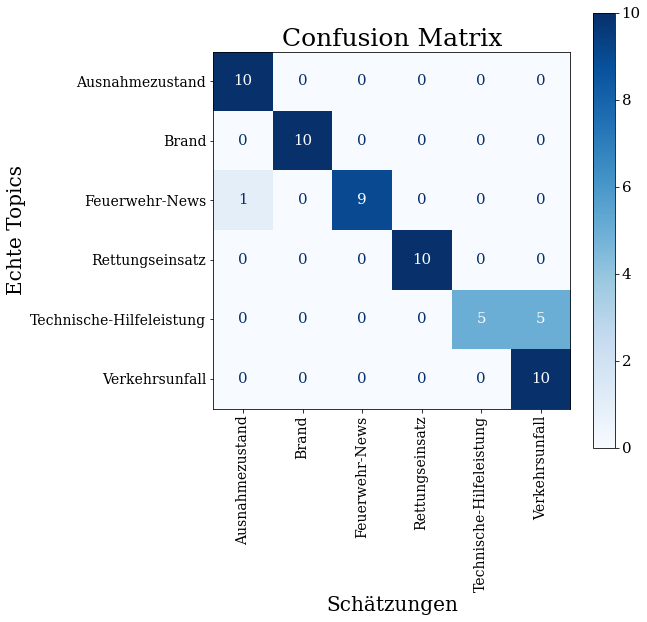

In [51]:
display_labels = set(result_comp['True-Topic'])
plot_confusion_matrix(result_comp['True-Topic'], result_comp['Predicted-Topic'], display_labels)

In [52]:
topics = set(result_comp['True-Topic'])

display_accuracy_for_labeled_dataset(result_comp, topics)

+----------------------------------------------------+
| Accuracy for Topic Ausnahmezustand:  0.91          |
+----------------------------------------------------+
| Accuracy for Topic Brand:  1.0                     |
+----------------------------------------------------+
| Accuracy for Topic Feuerwehr-News:  0.9            |
+----------------------------------------------------+
| Accuracy for Topic Rettungseinsatz:  1.0           |
+----------------------------------------------------+
| Accuracy for Topic Technische-Hilfeleistung:  0.5  |
+----------------------------------------------------+
| Accuracy for Topic Verkehrsunfall:  0.67           |
+----------------------------------------------------+
| Overall Accuracy:  0.9                             |
+----------------------------------------------------+


## Setup Optimisation Facilitation 
- loading comparison model

In [53]:
with open('modelA0,15_B0,05_K60NewDataAndLess_noiseV2.pkl', 'rb') as inp:
    mgp_comp = pickle.load(inp)
    inp.close()

- classify the same data with the second model

In [54]:
#setup parameters to reuse method to create the topics dataframe
doc_count_comp = np.array(mgp_comp.cluster_doc_count)
top_index_comp = doc_count_comp.argsort()[::-1]

topic_dict_comp = {}

for i, topic_num in enumerate(top_index_comp):
    topic_dict_comp[topic_num]=topic_num

In [55]:
top_index_comp

array([55, 47, 29,  7, 38, 39,  8, 17, 37,  6, 50, 11, 54,  5, 33, 48, 19,
       27, 46, 15, 21, 10,  1, 31, 34, 20, 56, 16,  9, 52, 13, 18, 59, 36,
       26, 30, 24, 23, 28, 35, 53,  3, 42, 45, 58,  4, 12, 40, 32, 25,  2,
       57, 49, 41, 51, 44, 43, 14, 22,  0], dtype=int64)

- pick a very small threshold just to get all the clusters (even if they probably dont matter)

In [56]:
threshold = np.finfo(np.float64).tiny

result_comp = create_topics_dataframe(data_text=combined_df['Tweet'], mgp_model=mgp_comp, threshold=threshold, topic_dict_param = topic_dict_comp, true_topics_param = true_topics , lemma_text=docList)
result_comp.head(10)

,Text,Predicted-Topic,True-Topic,Lemma-Text
0,Update: Der Brand ist gelöscht. 200 m² waren betroffen. Weitere Ausbreitung verhindert. 1 Person kam in eine Klinik. 3 Katzen wurden gerettet. Im Einsatz auch 2 #DLK #eLHF und 2 LHF der #LFW. @BA_Pankow und @drk_berlin #Nordost sorgen für Betreuung und Unterbringung der Bewohner.,47,Brand,"[updat, brand, löschen, m², betreffen, ausbreitung, verhindern, person, kommen, klinik, katze, retten, dlk, elhf, lhf, lfw, @ba_pankow, @drk_berlin, nordost, sorgen, betreuung, unterbringung, bewohner]"
1,Gestern Nachmittag entdeckten Passanten im #Weißensee im gleichnamigen Ortsteil 2 leblose Personen und alarmierten die Feuerwehr. Beide konnten nur noch tot geborgen werden. Es handelte sich um eine Frau und ein Kleinkind. Wir suchten den See nach weiteren Personen ab. Kein Fund.,54,Other,"[gestern, nachmittag, entdecken, passant, weißensee, gleichnamig, ortsteil, leblos, person, alarmierten, feuerwehr, beide, tot, bergen, handeln, frau, kleinkind, suchen, see, person, ab, fund]"
2,Ein Technischer Defekt im Klimagerät eines Regionalexpresses verursachte die Verpuffung mit leichter Rauchentwicklung. Kein Folgebrand. Keiner verletzt. Es blieb für uns bei der Erkundung und Kontrolle. Ein Techniker kontrolliert den Zug noch mal. #EstuK und an @DB_Bahn übergeben,19,Other,"[technischer, defekt, klimagerät, regionalexpres, verursachen, verpuffung, leicht, rauchentwicklung, folgebrand, verletzen, bleiben, erkundung, kontrolle, techniker, kontrollieren, zug, mal, @db_bahn, übergeben]"
3,Verpuffung im Bereich eines Triebwagen an einem Zug am #Hauptbahnhof in #Moabit. Es sind keine Personen verletzt. Wir kontrollieren hier aktuell den betroffenen Zug.,19,Other,"[verpuffung, bereich, triebwag, zug, hauptbahnhof, moabit, person, verletzen, kontrollieren, aktuell, betroffen, zug]"
4,Update #Wedding Wir werden noch längere Zeit mit Nachlöscharbeiten beschäftigt sein. Das Gebäude ist aktuell unbewohnbar. Die Anwohnenden werden anderweitig untergebracht. In #Nachbarschaftshilfe versorgten mehrere Personen Betroffene mit warmen Getränken. Vielen Dank dafür!,33,Other,"[wedding, lang, zeit, nachlöscharbeit, beschäftigen, gebäude, aktuell, unbewohnbar, anwohnende, anderweitig, unterbringen, nachbarschaftshilfe, versorgten, mehrere, person, betroffener, warm, getränk, vieler, dank, dafür]"
5,#Brand in #Wittenau. Seit 19:00 Uhr brennt es in der #Schlitzer_Straße dort in einem Industriebetrieb mit gefährlichen Stoffen. Wir erkunden mit 52 Einsatzkräften die Lage. Weitere Spezialkräfte der Feuerwehr sind auf der Anfahrt. Personen sind nicht gefährdet. Update folgt…,1,Brand,"[brand, wittenau, seit, brennen, schlitzer_straße, industriebetrieb, gefährlich, stoff, erkunden, einsatzkräft, lage, spezialkräfte, feuerwehr, anfahrt, person, gefährden]"
6,"Update: Es brannte eine Wohnung im 1.OG. 10 Personen wurden durch die Feuerwehr gerettet, davon 5 Personen über die Drehleiter. Nach der Sichtung von 13 Personen mussten 8 Verletzte in umliegende Krankenhäuser versorgt werden, davon 1 Person mit lebensgefährlichen Verletzungen.",47,Other,"[updat, brennen, wohnung, person, feuerwehr, retten, davon, person, drehleiter, sichtung, person, musst, verletzter, umliegend, krankenhaus, versorgen, davon, person, lebensgefährlich, verletzung]"
7,#Brand in #Spandau im 3.OG eines 4-geschossigen Wohngebäudes. Es wurden bereits 4 Personen über die Drehleiter der Feuerwehr gerettet. Eine Person wurde mit Hilfe eines Sprungpolsters gerettet. Die Brandbekämpfung wurde eingeleitet. 76 Einsatzkräften sind vor Ort. Update folgt...,47,Brand,"[brand, spandau, wohngebäud, bereits, person, drehleiter, feuerwehr, retten, person, hilfe, sprungpolster, retten, brandbekämpfung, einleiten, einsatzkräft]"
8,#Tierrettung in #Spandau Ein Schwan ist gegen ein Hallentor einer Werkstatt geflogen und taumelte etwas hilflos umher. Die Mitarbeiter kümmerten sich um das Tier und riefen die Feuerwehr. Bei unserem Eintreffen ging es ihm wieder gut. Wir brachten ihn zum

- merge lists

In [57]:
comp_clusters = result_comp['Predicted-Topic']
result['Comp Model Equivalent'] = comp_clusters
result = result.drop(['True-Topic'], axis=1)
result.head(10)

,Text,Predicted-Topic,Lemma-Text,Comp Model Equivalent
0,Update: Der Brand ist gelöscht. 200 m² waren betroffen. Weitere Ausbreitung verhindert. 1 Person kam in eine Klinik. 3 Katzen wurden gerettet. Im Einsatz auch 2 #DLK #eLHF und 2 LHF der #LFW. @BA_Pankow und @drk_berlin #Nordost sorgen für Betreuung und Unterbringung der Bewohner.,Brand,"[updat, brand, löschen, m², betreffen, ausbreitung, verhindern, person, kommen, klinik, katze, retten, dlk, elhf, lhf, lfw, @ba_pankow, @drk_berlin, nordost, sorgen, betreuung, unterbringung, bewohner]",47
1,Gestern Nachmittag entdeckten Passanten im #Weißensee im gleichnamigen Ortsteil 2 leblose Personen und alarmierten die Feuerwehr. Beide konnten nur noch tot geborgen werden. Es handelte sich um eine Frau und ein Kleinkind. Wir suchten den See nach weiteren Personen ab. Kein Fund.,Verkehrsunfall,"[gestern, nachmittag, entdecken, passant, weißensee, gleichnamig, ortsteil, leblos, person, alarmierten, feuerwehr, beide, tot, bergen, handeln, frau, kleinkind, suchen, see, person, ab, fund]",54
2,Ein Technischer Defekt im Klimagerät eines Regionalexpresses verursachte die Verpuffung mit leichter Rauchentwicklung. Kein Folgebrand. Keiner verletzt. Es blieb für uns bei der Erkundung und Kontrolle. Ein Techniker kontrolliert den Zug noch mal. #EstuK und an @DB_Bahn übergeben,Technische-Hilfeleistung,"[technischer, defekt, klimagerät, regionalexpres, verursachen, verpuffung, leicht, rauchentwicklung, folgebrand, verletzen, bleiben, erkundung, kontrolle, techniker, kontrollieren, zug, mal, @db_bahn, übergeben]",19
3,Verpuffung im Bereich eines Triebwagen an einem Zug am #Hauptbahnhof in #Moabit. Es sind keine Personen verletzt. Wir kontrollieren hier aktuell den betroffenen Zug.,Technische-Hilfeleistung,"[verpuffung, bereich, triebwag, zug, hauptbahnhof, moabit, person, verletzen, kontrollieren, aktuell, betroffen, zug]",19
4,Update #Wedding Wir werden noch längere Zeit mit Nachlöscharbeiten beschäftigt sein. Das Gebäude ist aktuell unbewohnbar. Die Anwohnenden werden anderweitig untergebracht. In #Nachbarschaftshilfe versorgten mehrere Personen Betroffene mit warmen Getränken. Vielen Dank dafür!,Feuerwehr-News,"[wedding, lang, zeit, nachlöscharbeit, beschäftigen, gebäude, aktuell, unbewohnbar, anwohnende, anderweitig, unterbringen, nachbarschaftshilfe, versorgten, mehrere, person, betroffener, warm, getränk, vieler, dank, dafür]",33
5,#Brand in #Wittenau. Seit 19:00 Uhr brennt es in der #Schlitzer_Straße dort in einem Industriebetrieb mit gefährlichen Stoffen. Wir erkunden mit 52 Einsatzkräften die Lage. Weitere Spezialkräfte der Feuerwehr sind auf der Anfahrt. Personen sind nicht gefährdet. Update folgt…,Technische-Hilfeleistung,"[brand, wittenau, seit, brennen, schlitzer_straße, industriebetrieb, gefährlich, stoff, erkunden, einsatzkräft, lage, spezialkräfte, feuerwehr, anfahrt, person, gefährden]",1
6,"Update: Es brannte eine Wohnung im 1.OG. 10 Personen wurden durch die Feuerwehr gerettet, davon 5 Personen über die Drehleiter. Nach der Sichtung von 13 Personen mussten 8 Verletzte in umliegende Krankenhäuser versorgt werden, davon 1 Person mit lebensgefährlichen Verletzungen.",Brand,"[updat, brennen, wohnung, person, feuerwehr, retten, davon, person, drehleiter, sichtung, person, musst, verletzter, umliegend, krankenhaus, versorgen, davon, person, lebensgefährlich, verletzung]",47
7,#Brand in #Spandau im 3.OG eines 4-geschossigen Wohngebäudes. Es wurden bereits 4 Personen über die Drehleiter der Feuerwehr gerettet. Eine Person wurde mit Hilfe eines Sprungpolsters gerettet. Die Brandbekämpfung wurde eingeleitet. 76 Einsatzkräften sind vor Ort. Update folgt...,Brand,"[brand, spandau, wohngebäud, bereits, person, drehleiter, feuerwehr, retten, person, hilfe, sprungpolster, retten, brandbekämpfung, einleiten, einsatzkräft]",47
8,#Tierrettung in #Spandau Ein Schwan ist gegen ein Hallentor einer Werkstatt geflogen und taumelte etwas hilflos umher. Die Mitarbeiter kümmerten sich um das Tier und rie

### Calculate Topic-Frequency of Clusters:

In [58]:
def getCorrelatingClusters(merged_df, cluster):
    rslt_df = merged_df[merged_df['Comp Model Equivalent'] == cluster]
    
    clusters = []
    for x in set(rslt_df['Predicted-Topic']):
        count = 0
        for y in rslt_df['Predicted-Topic']:
            if(x == y):
                count = count + 1
        clusters.append( np.array([cluster, x, round(count/len(rslt_df['Predicted-Topic']), 3)]))
        
    return clusters

In [59]:
getCorrelatingClusters(result, 55)

[array(['55', 'Rettungseinsatz', '0.987'], dtype='<U32'),
 array(['55', 'Brand', '0.008'], dtype='<U32'),
 array(['55', 'Ausnahmezustand', '0.001'], dtype='<U32'),
 array(['55', 'Verkehrsunfall', '0.003'], dtype='<U32'),
 array(['55', 'Feuerwehr-News', '0.001'], dtype='<U32')]

- merging this 2d array to dataframe

In [60]:
#topics = set(result['Topic'])
topics = top_index_comp
topic_clusters = []

for topic in topics:
    clu = getCorrelatingClusters(result, topic)
    for c in clu:
        topic_clusters.append(c)


In [61]:
topics_df = pd.DataFrame(topic_clusters, columns = ['Cluster','Topic', 'Relative Frequency'])

topics_df.head(10)

,Cluster,Topic,Relative Frequency
0,55,Rettungseinsatz,0.987
1,55,Brand,0.008
2,55,Ausnahmezustand,0.001
3,55,Verkehrsunfall,0.003
4,55,Feuerwehr-News,0.001
5,47,Rettungseinsatz,0.001
6,47,Brand,0.964
7,47,Ausnahmezustand,0.001
8,47,Verkehrsunfall,0.011
9,47,Feuerwehr-News,0.005


- selecting the comparison cluster topics according to highest relative frequency

In [62]:
# create df that holds the filtered rows
comp_cluster_df = pd.DataFrame(columns = ['Topic', 'Cluster', 'Relative Frequency'])

# get cluster ids for filtering
cluster_ids = set(topics_df['Cluster'])

# select topic for cluster according to relative frequency 
for id in cluster_ids:
    filtered_id = topics_df[topics_df['Cluster'] == id].loc[:,['Topic', 'Cluster', 'Relative Frequency']] # slicing over all rows and selcting columns
    comp_cluster_df = comp_cluster_df.append(filtered_id[filtered_id['Relative Frequency'] == filtered_id['Relative Frequency'].max()].iloc[0])

- Sorting according to cluster-number, to match the output of the model

In [63]:
comp_cluster_df_Sorted = pd.DataFrame(columns=['Label', 'Cluster'])
comp_cluster_df_Sorted['Cluster'] = comp_cluster_df['Cluster'].apply(pd.to_numeric)
comp_cluster_df_Sorted['Label'] = comp_cluster_df['Topic']
comp_cluster_df_Sorted = comp_cluster_df_Sorted.sort_values(by=['Cluster'])

In [64]:
comp_cluster_df_Sorted

,Label,Cluster
108,Technische-Hilfeleistung,1
175,Feuerwehr-News,2
161,Feuerwehr-News,3
169,Feuerwehr-News,4
67,Feuerwehr-News,5
51,Feuerwehr-News,6
16,Brand,7
33,Ausnahmezustand,8
129,Feuerwehr-News,9
98,Brand,10


- matching newly discovered comparison topic to the documents

In [65]:
# changing the cluster ids in the "result" data frame to corresponding topics
ids = comp_cluster_df['Cluster'].values

topics = comp_cluster_df['Topic'].values

# build dic to replace values
dic = {}

count = 0
for id in ids:
    dic[str(id)] = topics[count]
    count = count + 1

# matching ids with topics    
ids_from_result = result['Comp Model Equivalent'].values

matched_topics_with_ids = []

for id in ids_from_result:
    matched_topics_with_ids.append(dic[str(id)])
    
# create a new dataframe with the changed values so "result" is not getting overwritten

topics_comparison_df = pd.DataFrame(columns=['Text', 'Lemma-text', 'Topic', 'Comp Model Equivalent'])
topics_comparison_df['Text'] = result['Text']
topics_comparison_df['Lemma-text'] = result['Lemma-Text']
topics_comparison_df['Topic'] = result['Predicted-Topic']
topics_comparison_df['Comp Model Equivalent'] = matched_topics_with_ids
    


topics_comparison_df


,Text,Lemma-text,Topic,Comp Model Equivalent
0,Update: Der Brand ist gelöscht. 200 m² waren betroffen. Weitere Ausbreitung verhindert. 1 Person kam in eine Klinik. 3 Katzen wurden gerettet. Im Einsatz auch 2 #DLK #eLHF und 2 LHF der #LFW. @BA_Pankow und @drk_berlin #Nordost sorgen für Betreuung und Unterbringung der Bewohner.,"[updat, brand, löschen, m², betreffen, ausbreitung, verhindern, person, kommen, klinik, katze, retten, dlk, elhf, lhf, lfw, @ba_pankow, @drk_berlin, nordost, sorgen, betreuung, unterbringung, bewohner]",Brand,Brand
1,Gestern Nachmittag entdeckten Passanten im #Weißensee im gleichnamigen Ortsteil 2 leblose Personen und alarmierten die Feuerwehr. Beide konnten nur noch tot geborgen werden. Es handelte sich um eine Frau und ein Kleinkind. Wir suchten den See nach weiteren Personen ab. Kein Fund.,"[gestern, nachmittag, entdecken, passant, weißensee, gleichnamig, ortsteil, leblos, person, alarmierten, feuerwehr, beide, tot, bergen, handeln, frau, kleinkind, suchen, see, person, ab, fund]",Verkehrsunfall,Verkehrsunfall
2,Ein Technischer Defekt im Klimagerät eines Regionalexpresses verursachte die Verpuffung mit leichter Rauchentwicklung. Kein Folgebrand. Keiner verletzt. Es blieb für uns bei der Erkundung und Kontrolle. Ein Techniker kontrolliert den Zug noch mal. #EstuK und an @DB_Bahn übergeben,"[technischer, defekt, klimagerät, regionalexpres, verursachen, verpuffung, leicht, rauchentwicklung, folgebrand, verletzen, bleiben, erkundung, kontrolle, techniker, kontrollieren, zug, mal, @db_bahn, übergeben]",Technische-Hilfeleistung,Technische-Hilfeleistung
3,Verpuffung im Bereich eines Triebwagen an einem Zug am #Hauptbahnhof in #Moabit. Es sind keine Personen verletzt. Wir kontrollieren hier aktuell den betroffenen Zug.,"[verpuffung, bereich, triebwag, zug, hauptbahnhof, moabit, person, verletzen, kontrollieren, aktuell, betroffen, zug]",Technische-Hilfeleistung,Technische-Hilfeleistung
4,Update #Wedding Wir werden noch längere Zeit mit Nachlöscharbeiten beschäftigt sein. Das Gebäude ist aktuell unbewohnbar. Die Anwohnenden werden anderweitig untergebracht. In #Nachbarschaftshilfe versorgten mehrere Personen Betroffene mit warmen Getränken. Vielen Dank dafür!,"[wedding, lang, zeit, nachlöscharbeit, beschäftigen, gebäude, aktuell, unbewohnbar, anwohnende, anderweitig, unterbringen, nachbarschaftshilfe, versorgten, mehrere, person, betroffener, warm, getränk, vieler, dank, dafür]",Feuerwehr-News,Feuerwehr-News
5,#Brand in #Wittenau. Seit 19:00 Uhr brennt es in der #Schlitzer_Straße dort in einem Industriebetrieb mit gefährlichen Stoffen. Wir erkunden mit 52 Einsatzkräften die Lage. Weitere Spezialkräfte der Feuerwehr sind auf der Anfahrt. Personen sind nicht gefährdet. Update folgt…,"[brand, wittenau, seit, brennen, schlitzer_straße, industriebetrieb, gefährlich, stoff, erkunden, einsatzkräft, lage, spezialkräfte, feuerwehr, anfahrt, person, gefährden]",Technische-Hilfeleistung,Technische-Hilfeleistung
6,"Update: Es brannte eine Wohnung im 1.OG. 10 Personen wurden durch die Feuerwehr gerettet, davon 5 Personen über die Drehleiter. Nach der Sichtung von 13 Personen mussten 8 Verletzte in umliegende Krankenhäuser versorgt werden, davon 1 Person mit lebensgefährlichen Verletzungen.","[updat, brennen, wohnung, person, feuerwehr, retten, davon, person, drehleiter, sichtung, person, musst, verletzter, umliegend, krankenhaus, versorgen, davon, person, lebensgefährlich, verletzung]",Brand,Brand
7,#Brand in #Spandau im 3.OG eines 4-geschossigen Wohngebäudes. Es wurden bereits 4 Personen über die Drehleiter der Feuerwehr gerettet. Eine Person wurde mit Hilfe eines Sprungpolsters gerettet. Die Brandbekämpfung wurde eingeleitet. 76 Einsatzkräften sind vor Ort. Update folgt...,"[brand, spandau, wohngebäud, bereits, person, drehleiter, feuerwehr, retten, person, hilfe, sprungpolster, retten, brandbekämpfung, einleiten, einsatzkräft]",Brand,Brand
8,#Tierrettung in #Spandau Ein Schwan ist gegen ein Hallentor einer Werkstatt gef

- how many documents have been classified differently?

In [66]:
len(topics_comparison_df[topics_comparison_df['Topic'] != topics_comparison_df['Comp Model Equivalent']])

1257

- of how many Tweets?

In [67]:
print(len(topics_comparison_df))

9450


- calculation of the Jaccard-Distance for a topic

In [68]:
def calculate_jaccard_coefficient(comp_df, topic, row_name1, row_name2):
    
    D1andD2 = len(comp_df[(comp_df[row_name1] == topic) & (comp_df[row_name2] == topic)])

    inequalities = topics_comparison_df[topics_comparison_df[row_name1] != topics_comparison_df[row_name2]]

    D1orD2 = len(inequalities[inequalities[row_name1] == topic]) + len(inequalities[inequalities[row_name2] == topic]) + D1andD2
    
    return round(D1andD2/D1orD2, 4), D1orD2 

In [69]:
for topic in set(topics_comparison_df['Topic'].values):
    ret = calculate_jaccard_coefficient(topics_comparison_df, topic, 'Topic', 'Comp Model Equivalent')
    print('Jaccard Coefficient for '+topic+': '+str(ret[0])+' | '+'number of documents per topic: '+str(ret[1]))
    print(' ')



Jaccard Coefficient for Rettungseinsatz: 0.9162 | number of documents per topic: 1694
 
Jaccard Coefficient for Brand: 0.8669 | number of documents per topic: 3418
 
Jaccard Coefficient for Ausnahmezustand: 0.5084 | number of documents per topic: 594
 
Jaccard Coefficient for Verkehrsunfall: 0.6824 | number of documents per topic: 1247
 
Jaccard Coefficient for Feuerwehr-News: 0.7651 | number of documents per topic: 2822
 
Jaccard Coefficient for Technische-Hilfeleistung: 0.3927 | number of documents per topic: 932
 


## Accuracy of Comparison Model

### Classifying Training-Data

In [70]:
doc_count = np.array(mgp_comp.cluster_doc_count)
top_index_comp = doc_count.argsort()[::-1]
#top_words(mgp_comp.cluster_word_distribution, top_index_comp, 10)
top_index_comp.sort()
top_index_comp

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59], dtype=int64)

In [71]:

topic_dict_comp = {}
topic_names_comp = comp_cluster_df_Sorted['Label'].to_numpy()

counter = 0
for i, topic_num in enumerate(top_index_comp):
    if(topic_num not in comp_cluster_df_Sorted['Cluster'].values):
        print(topic_num)
        topic_dict_comp[topic_num]='Feuerwehr-News'
        
    else:
        topic_dict_comp[topic_num]=topic_names_comp[counter]
        counter = counter +1

0
14
22
41
43
44
51


In [72]:
comp_cluster_df_Sorted['Cluster'].values

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 15, 16, 17, 18,
       19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36,
       37, 38, 39, 40, 42, 45, 46, 47, 48, 49, 50, 52, 53, 54, 55, 56, 57,
       58, 59], dtype=int64)

In [73]:
print(topic_dict_comp)

{0: 'Feuerwehr-News', 1: 'Technische-Hilfeleistung', 2: 'Feuerwehr-News', 3: 'Feuerwehr-News', 4: 'Feuerwehr-News', 5: 'Feuerwehr-News', 6: 'Feuerwehr-News', 7: 'Brand', 8: 'Ausnahmezustand', 9: 'Feuerwehr-News', 10: 'Brand', 11: 'Rettungseinsatz', 12: 'Feuerwehr-News', 13: 'Feuerwehr-News', 14: 'Feuerwehr-News', 15: 'Feuerwehr-News', 16: 'Feuerwehr-News', 17: 'Verkehrsunfall', 18: 'Feuerwehr-News', 19: 'Technische-Hilfeleistung', 20: 'Feuerwehr-News', 21: 'Feuerwehr-News', 22: 'Feuerwehr-News', 23: 'Feuerwehr-News', 24: 'Feuerwehr-News', 25: 'Feuerwehr-News', 26: 'Feuerwehr-News', 27: 'Feuerwehr-News', 28: 'Feuerwehr-News', 29: 'Brand', 30: 'Feuerwehr-News', 31: 'Feuerwehr-News', 32: 'Feuerwehr-News', 33: 'Feuerwehr-News', 34: 'Feuerwehr-News', 35: 'Feuerwehr-News', 36: 'Feuerwehr-News', 37: 'Technische-Hilfeleistung', 38: 'Brand', 39: 'Verkehrsunfall', 40: 'Feuerwehr-News', 41: 'Feuerwehr-News', 42: 'Feuerwehr-News', 43: 'Feuerwehr-News', 44: 'Feuerwehr-News', 45: 'Feuerwehr-News', 4

In [74]:
threshold = np.finfo(np.float64).tiny

combined_topics_df = create_topics_dataframe(data_text=evaluation_df['Text'], mgp_model=mgp_comp, threshold=0.1, topic_dict_param = topic_dict_comp, true_topics_param = evaluation_df['Topic'] , lemma_text=evaluation_docs)

combined_topics_df.drop(combined_topics_df[combined_topics_df['True-Topic'] == 'Wasserrettung'].index, inplace = True)
combined_topics_df.head(100)

,Text,Predicted-Topic,True-Topic,Lemma-Text
0,#Brand in #Prenzlauer_Berg Es brennt das Dach eines Wohngebäudes in der #Paul_Robeson_Straße Es wurden weitere Fahrzeuge und Kräfte nachalarmiert. Wir sind hier aktuell mit rund 52 Kräften im Einsatz bzw. auf der Anfahrt. Weitere Infos folgen …,Brand,Brand,"[brand, prenzlauer_berg, brennen, dach, wohngebäud, paul_robeson_straße, fahrzeug, nachalarmieren, aktuell, rund, bzw., anfahrt]"
1,"In der vergangenen Nacht kam es in der #Charlottenburger_Straße in #Weißensee zu einem #Brand in einer Wohnung eines dreigeschossigen Mehrfamilienhauses. Dabei konnte eine Person nur noch tot geborgen werden. Eingesetzt: 1 C-Rohr, 4 Atemschutzgeräte. Vor Ort: 22 Kräfte. #EstuK",Brand,Brand,"[vergangen, nacht, kommen, charlottenburger_straße, weißensee, brand, wohnung, dreigeschossig, mehrfamilienhauses, dabei, person, tot, bergen, einsetzen, c-rohr, atemschutzgerät]"
2,"#Brand im Keller eines #Hochhaus​es in der #Bismarckstraße in #Charlottenburg. Rauchausbreitung in mehrere Hausaufgänge. Alles kontrolliert und belüftet. Keiner verletzt. Eingesetzt: u.a. 1 C-Rohr, 10 Atemschutzgeräte, 1 Drucklüfter. Vor Ort waren wir mit 48 Kräften. #EstuK",Brand,Brand,"[brand, keller, hochhaus​es, bismarckstraße, charlottenburg, rauchausbreitung, mehrere, hausaufgäng, kontrollieren, belüften, verletzen, einsetzen, u.a., c-rohr, atemschutzgerat, drucklüfter]"
3,"In der Straße #Rue_Racine in #Wittenau kam es in einer ehemaligen Schule zu einem #Brand im Keller des dreigeschossigen leerstehenden Gebäudes. Im Einsatz waren 38 Kräfte (auch die #FF mit 2 TLF und 1 SW) und setzten u.a. 1 C-Rohr, 2 Atemschutzgeräte und 1 Drucklüfter ein. #EstuK",Brand,Brand,"[straße, rue_racine, wittenau, kommen, ehemalig, schule, brand, keller, dreigeschossig, leerstehend, gebäude, ff, tlf, sw, setzen, u.a., c-rohr, atemschutzgerät, drucklüfter]"
4,"In der #Danziger_Straße in #Prenzlauer_Berg kam es zu einem #Brand in der Küche eines Restaurants im EG eines fünfgeschossigen Gebäudes. Wir setzten u.a. 1 C-Rohr, 4 Atemschutzgeräte und 1 Drucklüfter ein. Mehrere Wohnungen kontrolliert. Keiner verletzt. 24 Kräfte tätig. #EstuK",Brand,Brand,"[danziger_straße, prenzlauer_berg, kommen, brand, küche, restaurant, eg, fünfgeschossig, gebäude, setzen, u.a., c-rohr, atemschutzgerat, drucklüfter, mehrere, wohnung, kontrollieren, verletzen, tätig]"
5,"(2/2) 120 Kräfte sind aktuell im Einsatz, darunter auch alle 3 #Lehrfeuerwachen und diverse #Freiwillige_Feuerwehr|en. Die Brandbekämpfung läuft über 2 #DLK und mit diversen Strahlrohren im Innen- und Außenangriff. Zur Lagebeurteilung wird eine #Drohne eingesetzt.",Brand,Brand,"[aktuell, darunter, lehrfeuerwachen, diverser, freiwillige_feuerwehr|en, brandbekämpfung, laufen, dlk, diverser, strahlrohr, innen, außenangriff, lagebeurteilung, drohne, einsetzen]"
6,"Update #Wedding (1/2) Es brennt eine Wohnung im 4. OG mit Übergriff auf das 350 qm große Dach des 5-geschossigen Wohnhauses. 2 Personen wurden verletzt, wovon 1 P. in eine Klinik gebracht wurde. Rund 50 Personen wurden aus dem Gebäude in Sicherheit gebracht und im #MTF3 betreut.",Brand,Brand,"[wedding, brennen, wohnung, og, übergriff, qm, groß, dach, wohnhaus, person, verletzen, wovon, p., klinik, bringen, rund, person, gebäude, sicherheit, bringen, betreuen]"
7,#Brand in einem Wohngebäude mit Übergriff auf das Dach in der #Amsterdamer_Straße in #Wedding. Es wurden weitere Fahrzeuge und Kräfte nachalarmiert. Wir sind hier aktuell mit rund 110 Kräften im Einsatz bzw. auf der Anfahrt. Weitere Infos folgen …,Brand,Brand,"[brand, wohngebäude, übergriff, dach, amsterdamer_straße, wedding, fahrzeug, nachalarmieren, aktuell, rund, bzw., anfahrt]"
8,"Update: Es brannte in einem Industriebetrieb eine Reinigungsflüssigkeit. Der Brand wurde mit 50 kg Sonderlöschmittel (CO2) erfolgreich bekämpft. Eine Person wurde durch den Rettungsdienst gesichtet, Personen u. Umwelt waren nicht gefährdet.Wir waren mit 101 Einsatzkräften vor Ort",Brand,Brand,"[updat, brennen,

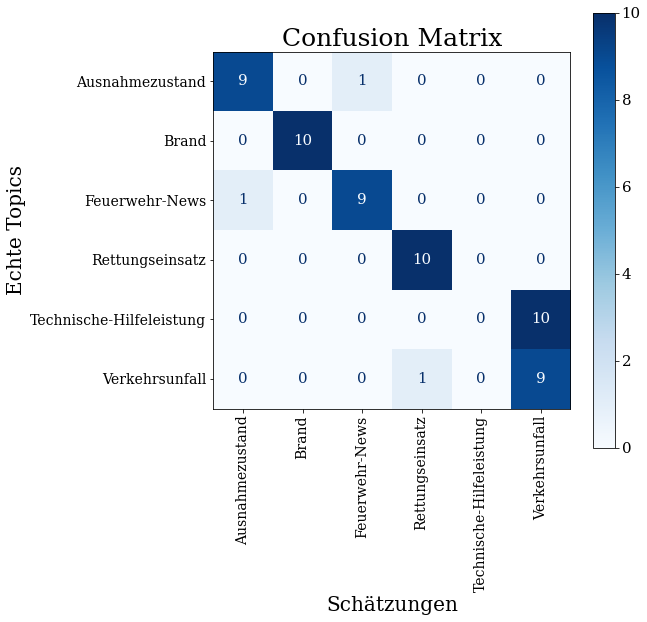

In [75]:
display_labels = set(combined_topics_df['True-Topic'])
plot_confusion_matrix(combined_topics_df['True-Topic'], combined_topics_df['Predicted-Topic'], display_labels)

In [76]:
display_accuracy_for_labeled_dataset(combined_topics_df, display_labels)

+----------------------------------------------------+
| Accuracy for Topic Ausnahmezustand:  0.82          |
+----------------------------------------------------+
| Accuracy for Topic Brand:  1.0                     |
+----------------------------------------------------+
| Accuracy for Topic Feuerwehr-News:  0.82           |
+----------------------------------------------------+
| Accuracy for Topic Rettungseinsatz:  0.91          |
+----------------------------------------------------+
| Accuracy for Topic Technische-Hilfeleistung:  0.0  |
+----------------------------------------------------+
| Accuracy for Topic Verkehrsunfall:  0.45           |
+----------------------------------------------------+
| Overall Accuracy:  0.78                            |
+----------------------------------------------------+
